# Deep Learning Week 5 I’m Something of a Painter Myself

## Problem to Solve: Use GANs to create art 
A GAN consists of at least two neural networks: a generator model and a discriminator model. The generator is a neural network that creates the images. For our competition, you should generate images in the style of Monet. This generator is trained using a discriminator.

The two models will work against each other, with the generator trying to trick the discriminator, and the discriminator trying to accurately classify the real vs. generated images.

The task is to build a GAN that generates 7,000 to 10,000 Monet-style images.
https://www.kaggle.com/competitions/gan-getting-started/overview

## Data Source
The data was downloaded from the internet.
https://www.kaggle.com/competitions/gan-getting-started/data

Data includes: 

A/ Monet data

B/ Photo data

## Deep Learning Methods Used
GAN: Build a GAN that generates 7,000 to 10,000 Monet-style images. GAN is a pretty good tool to generate new instances from training data, and that's why we're using GAN for this challege.


# Table of Contents:
1. Import depencies or libraries that need to be used in this project
2. EDA step. Read and parse the input data from the defined paths and clean up the data.
3. EDA step. Display images for the input data
4. Apply GEN on the test data with original paramters and generate results.
5. Apply GEN on the test data with different tunining parameters and generate results.
6. Takeaways

### 1. Import depencies or libraries that need to be used in this project


In [9]:
import tensorflow as tf
from tensorflow.keras import mixed_precision
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    print('Device:', tpu.master())
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
except:
    strategy = tf.distribute.get_strategy()
print('strategy.num_replicas_in_sync:', strategy.num_replicas_in_sync)

AUTOTUNE = tf.data.experimental.AUTOTUNE

# Get the current working directory
current_dir = os.getcwd()
print("Current working directory:", current_dir)

# Path to test and train data
monet_tfrecord_path = os.path.join(current_dir, 'gan-getting-started/monet_tfrec/*.tfrec')
photo_tfrecord_path = os.path.join(current_dir, 'gan-getting-started/photo_tfrec/*.tfrec')
print("monet_tfrecord_path: ", monet_tfrecord_path)
print("photo_tfrecord_path: ", photo_tfrecord_path)

output_dir = os.path.join(current_dir, 'generated_output_images')
os.makedirs(output_dir, exist_ok=True)
print("Results will be stored in: ", output_dir)

DEBUG_VERBOSE = False

strategy.num_replicas_in_sync: 1
Current working directory: /Volumes/WD5TBForMac-1/CU-Boulder-MSCS/Term4/DeepLearning/Week5
monet_tfrecord_path:  /Volumes/WD5TBForMac-1/CU-Boulder-MSCS/Term4/DeepLearning/Week5/gan-getting-started/monet_tfrec/*.tfrec
photo_tfrecord_path:  /Volumes/WD5TBForMac-1/CU-Boulder-MSCS/Term4/DeepLearning/Week5/gan-getting-started/photo_tfrec/*.tfrec
Results will be stored in:  /Volumes/WD5TBForMac-1/CU-Boulder-MSCS/Term4/DeepLearning/Week5/generated_output_images


### 2. EDA step. Read the input data from the defined paths and clean up data.

In [2]:
def _parse_function(proto):
    keys_to_features = {
        'image': tf.io.FixedLenFeature([], tf.string),
    }

    parsed_features = tf.io.parse_single_example(proto, keys_to_features)
    
    image = tf.io.decode_jpeg(parsed_features['image'])
    image = tf.image.resize(image, [256, 256])
    image = (image / 127.5) - 1
    return image

def load_tfrecord_dataset(file_pattern, batch_size):
    # load data
    dataset = tf.data.TFRecordDataset(tf.io.gfile.glob(file_pattern))
    # map to each sample
    dataset = dataset.map(_parse_function, num_parallel_calls=tf.data.AUTOTUNE)
    # batch
    dataset = dataset.batch(batch_size)
    return dataset

def augment(image):
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_crop(image, size=[256, 256, 3])
    return image

def augment_batch(images):
    return tf.map_fn(augment, images, fn_output_signature=tf.float32)

# Load the datasets and apply augmentation
BATCH_SIZE = 1
monet_tfrecord_dataset = load_tfrecord_dataset(monet_tfrecord_path, batch_size=BATCH_SIZE).map(lambda x: augment_batch(x), num_parallel_calls=tf.data.AUTOTUNE)
photo_tfrecord_dataset = load_tfrecord_dataset(photo_tfrecord_path, batch_size=BATCH_SIZE).map(lambda x: augment_batch(x), num_parallel_calls=tf.data.AUTOTUNE)
print(monet_tfrecord_dataset)
print(photo_tfrecord_dataset)

    
def count_examples(dataset):
    count = 0
    for _ in dataset:
        count += 1
    return count

print(f'Number of Monet files: {count_examples(monet_tfrecord_dataset)}')
print(f'Number of Photo files: {count_examples(photo_tfrecord_dataset)}')

<_ParallelMapDataset element_spec=TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None)>
<_ParallelMapDataset element_spec=TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None)>
Number of Monet files: 300


2024-06-16 13:48:42.632939: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Number of Photo files: 7038


2024-06-16 13:48:45.692524: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Discussions: From the data output, we can see that there are 75 Monet and 1760 entries in the data.
The data has been cleaned up or parse correctly.

### 3. EDA step. Display plots for the input data

A. Display some sample images from monet_tfrecord_dataset

2024-06-16 13:48:45.986994: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


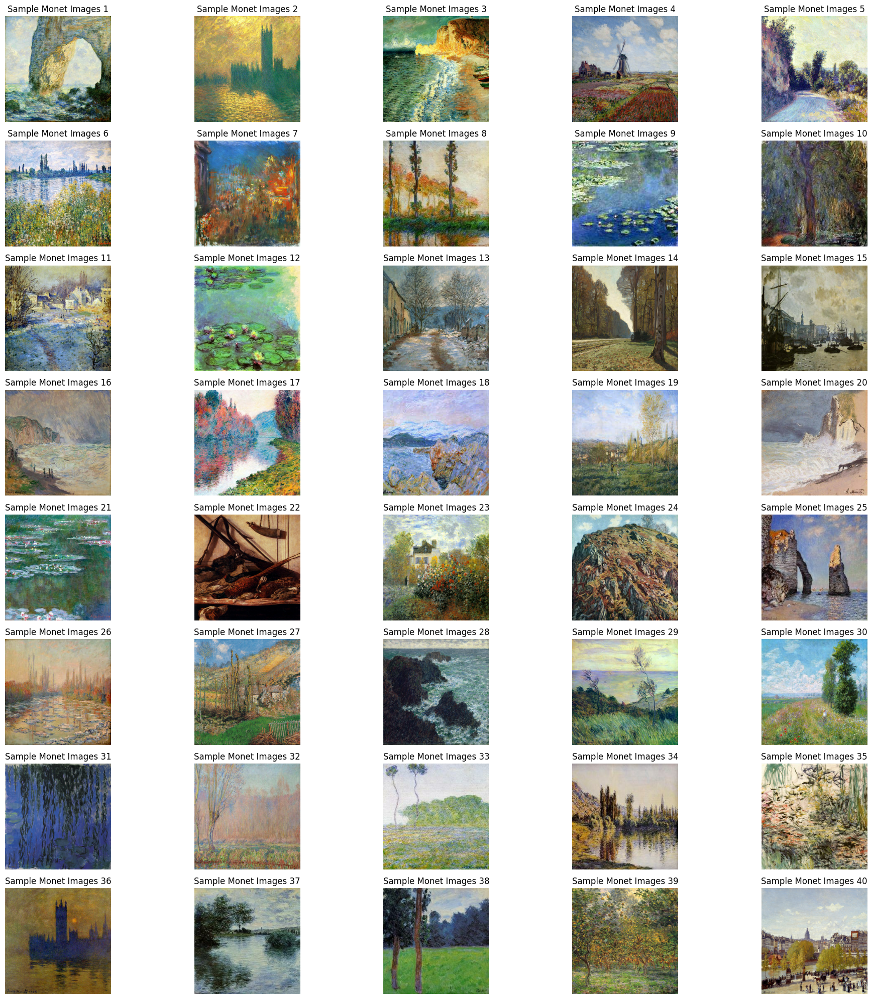

In [3]:
def show_images(dataset, title, num_images=40):
    plt.figure(figsize=(20, 20))
    for i, image in enumerate(dataset.take(num_images)):
        plt.subplot(8, 5, i + 1)
        plt.imshow(image[0] * 0.5 + 0.5)
        plt.title(f"{title} {i+1}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()
    
show_images(monet_tfrecord_dataset, 'Sample Monet Images', num_images=40)


Discussions: The plot above shows data is pretty even between 0 and 1 which means we dont get bias results.

B. Show Images from photo_tfrecord_dataset

2024-06-16 13:48:47.569009: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


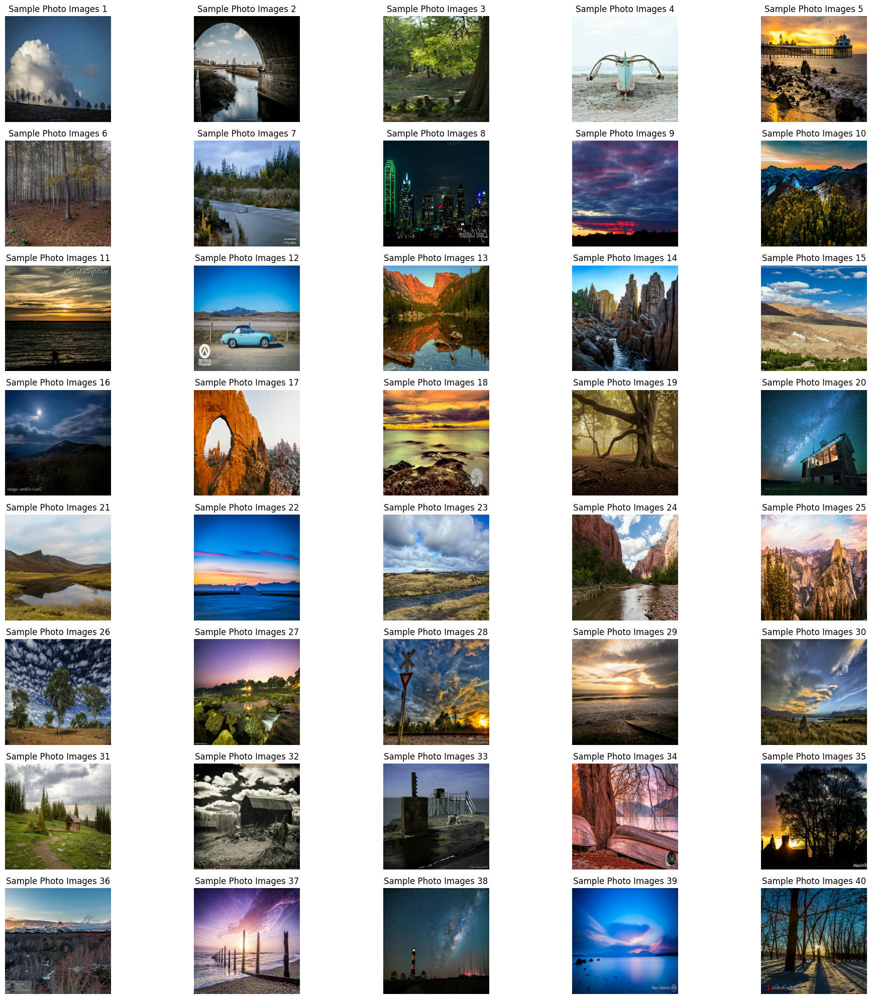

In [4]:
show_images(photo_tfrecord_dataset, 'Sample Photo Images', num_images=40)


Discussions: The monet and photo images above show we've successfully load the TFREC files. Since we've confirmed the input paths and data have been loaded, we can start working on our model next. This is a neccesary step to ensure our input is correct before we proceed so that we don't get any unexpected behaviors while we're training our models.

### 4. Apply GEN and display results

## Plans: Apply the method with params such as:

1/ epoch = 5 means how many times the data will go through the training process. the more the model gets trained, the more improvement the results have.

2/ learning_rate=1e-4

3/ BatchNormalization

4/ Direct Loading to get data order as it's read


#### A. Create helper functions

In [5]:
# tunning params
generator_g_optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4, beta_1=0.5)
discriminator_x_optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4, beta_1=0.5)
EPOCHS = 5

def downsample(filters, size, apply_batchnorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                                      kernel_initializer=initializer, use_bias=False))
    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())
    result.add(tf.keras.layers.LeakyReLU())
    return result

def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2, padding='same',
                                               kernel_initializer=initializer, use_bias=False))
    result.add(tf.keras.layers.BatchNormalization())
    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))
    result.add(tf.keras.layers.ReLU())
    return result

def Generator():
    inputs = tf.keras.layers.Input(shape=[256, 256, 3])
    down_stack = [
        downsample(64, 4, apply_batchnorm=False),
        downsample(128, 4),
        downsample(256, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
    ]
    up_stack = [
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4),
        upsample(256, 4),
        upsample(128, 4),
        upsample(64, 4),
    ]
    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(3, 4, strides=2, padding='same',
                                           kernel_initializer=initializer, activation='tanh')
    x = inputs
    for down in down_stack:
        x = down(x)
    for up in up_stack:
        x = up(x)
    x = last(x)
    return tf.keras.Model(inputs=inputs, outputs=x)

def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
    x = tf.keras.layers.Conv2D(64, 4, strides=2, padding='same',
                               kernel_initializer=initializer)(inp)
    x = tf.keras.layers.LeakyReLU()(x)
    x = tf.keras.layers.Conv2D(128, 4, strides=2, padding='same',
                               kernel_initializer=initializer)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU()(x)
    x = tf.keras.layers.Conv2D(256, 4, strides=2, padding='same',
                               kernel_initializer=initializer)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU()(x)
    x = tf.keras.layers.ZeroPadding2D()(x)
    x = tf.keras.layers.Conv2D(512, 4, strides=1, padding='valid',
                               kernel_initializer=initializer)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU()(x)
    x = tf.keras.layers.Conv2D(1, 4, strides=1, padding='valid',
                               kernel_initializer=initializer)(x)
    return tf.keras.Model(inputs=inp, outputs=x)


#### B. Create gen and dis functions


In [6]:
LAMBDA = 10

loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def generator_loss(disc_generated_output):
    return tf.keras.losses.BinaryCrossentropy(from_logits=True)(tf.ones_like(disc_generated_output), disc_generated_output)

def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss * 0.5

def cycle_loss(real_image, cycled_image):
    loss = tf.reduce_mean(tf.abs(real_image - cycled_image))
    return LAMBDA * loss

def identity_loss(real_image, same_image):
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return LAMBDA * 0.5 * loss

### C. Train the model and generate results

2024-06-16 13:54:43.661022: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch #1: Generator G Loss: 14.410969734191895, Generator F Loss: 12.777055740356445, Discriminator X Loss: 0.0023788248654454947, Discriminator Y Loss: 0.001138791674748063


2024-06-16 14:00:31.843998: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch #2: Generator G Loss: 15.358189582824707, Generator F Loss: 13.775333404541016, Discriminator X Loss: 0.0008295704610645771, Discriminator Y Loss: 0.0003844558959826827


2024-06-16 14:06:27.004289: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch #3: Generator G Loss: 15.668919563293457, Generator F Loss: 14.058055877685547, Discriminator X Loss: 0.0004849142860621214, Discriminator Y Loss: 0.0002392336173215881


2024-06-16 14:12:32.277576: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch #4: Generator G Loss: 16.049171447753906, Generator F Loss: 14.37586498260498, Discriminator X Loss: 0.00033153744880110025, Discriminator Y Loss: 0.00015038780111353844


2024-06-16 14:18:28.933313: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch #5: Generator G Loss: 16.435514450073242, Generator F Loss: 14.823450088500977, Discriminator X Loss: 0.00024113903054967523, Discriminator Y Loss: 0.00010450289119035006


2024-06-16 14:24:26.966382: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch #6: Generator G Loss: 16.732627868652344, Generator F Loss: 15.121397018432617, Discriminator X Loss: 0.00017367802502121776, Discriminator Y Loss: 7.461408677045256e-05


2024-06-16 14:30:16.041112: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch #7: Generator G Loss: 16.930295944213867, Generator F Loss: 15.330092430114746, Discriminator X Loss: 0.00013742249575443566, Discriminator Y Loss: 5.8290599554311484e-05


2024-06-16 14:36:07.720400: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch #8: Generator G Loss: 17.097169876098633, Generator F Loss: 15.527322769165039, Discriminator X Loss: 0.0001283924502786249, Discriminator Y Loss: 4.933920718031004e-05


2024-06-16 14:41:57.480842: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch #9: Generator G Loss: 17.291730880737305, Generator F Loss: 15.742149353027344, Discriminator X Loss: 0.0001002554054139182, Discriminator Y Loss: 4.126217754674144e-05


2024-06-16 14:48:05.261597: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch #10: Generator G Loss: 17.423320770263672, Generator F Loss: 15.858449935913086, Discriminator X Loss: 9.176468302030116e-05, Discriminator Y Loss: 3.701337845996022e-05


2024-06-16 14:48:05.539924: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


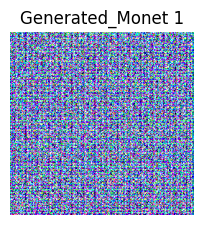

2024-06-16 14:48:05.993364: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


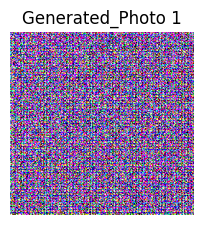

2024-06-16 14:54:20.353682: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch #11: Generator G Loss: 17.74102783203125, Generator F Loss: 16.24627113342285, Discriminator X Loss: 6.735011265845969e-05, Discriminator Y Loss: 2.8139296773588285e-05


2024-06-16 15:00:34.849019: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch #12: Generator G Loss: 18.03887367248535, Generator F Loss: 16.553258895874023, Discriminator X Loss: 5.2258918003644794e-05, Discriminator Y Loss: 2.1633602955262177e-05


2024-06-16 15:06:50.813784: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch #13: Generator G Loss: 18.294397354125977, Generator F Loss: 16.824565887451172, Discriminator X Loss: 4.1346494981553406e-05, Discriminator Y Loss: 1.704708847682923e-05


2024-06-16 15:13:15.371002: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch #14: Generator G Loss: 18.53383445739746, Generator F Loss: 17.06207847595215, Discriminator X Loss: 3.4154927561758086e-05, Discriminator Y Loss: 1.4396550795936491e-05


2024-06-16 15:19:31.703428: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch #15: Generator G Loss: 18.709712982177734, Generator F Loss: 17.279579162597656, Discriminator X Loss: 3.160314372507855e-05, Discriminator Y Loss: 1.1924597856705077e-05


2024-06-16 15:25:44.712568: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch #16: Generator G Loss: 18.907819747924805, Generator F Loss: 17.454975128173828, Discriminator X Loss: 2.3968092136783525e-05, Discriminator Y Loss: 1.0219222531304695e-05


2024-06-16 15:32:21.748557: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch #17: Generator G Loss: 19.100622177124023, Generator F Loss: 17.613540649414062, Discriminator X Loss: 2.2622087271884084e-05, Discriminator Y Loss: 8.488660569128115e-06


2024-06-16 15:38:58.604209: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch #18: Generator G Loss: 19.243545532226562, Generator F Loss: 17.754079818725586, Discriminator X Loss: 1.7105860024457797e-05, Discriminator Y Loss: 6.920373380125966e-06


In [ ]:
generator_g = Generator()
generator_f = Generator()
discriminator_x = Discriminator()
discriminator_y = Discriminator()

@tf.function
def train_step(real_x, real_y):
    with tf.GradientTape(persistent=True) as tape:
        fake_y = generator_g(real_x, training=True)
        cycled_x = generator_f(fake_y, training=True)
        fake_x = generator_f(real_y, training=True)
        cycled_y = generator_g(fake_x, training=True)

        same_x = generator_f(real_x, training=True)
        same_y = generator_g(real_y, training=True)

        disc_real_x = discriminator_x(real_x, training=True)
        disc_real_y = discriminator_y(real_y, training=True)
        disc_fake_x = discriminator_x(fake_x, training=True)
        disc_fake_y = discriminator_y(fake_y, training=True)

        gen_g_loss = generator_loss(disc_fake_y)
        gen_f_loss = generator_loss(disc_fake_x)
        total_cycle_loss = cycle_loss(real_x, cycled_x) + cycle_loss(real_y, cycled_y)
        total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
        total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)

        disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
        disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)

    generator_g_gradients = tape.gradient(total_gen_g_loss, generator_g.trainable_variables)
    generator_f_gradients = tape.gradient(total_gen_f_loss, generator_f.trainable_variables)
    discriminator_x_gradients = tape.gradient(disc_x_loss, discriminator_x.trainable_variables)
    discriminator_y_gradients = tape.gradient(disc_y_loss, discriminator_y.trainable_variables)

    generator_g_optimizer.apply_gradients(zip(generator_g_gradients, generator_g.trainable_variables))
    generator_f_optimizer.apply_gradients(zip(generator_f_gradients, generator_f.trainable_variables))
    discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients, discriminator_x.trainable_variables))
    discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients, discriminator_y.trainable_variables))

    return total_gen_g_loss, total_gen_f_loss, disc_x_loss, disc_y_loss

def plot_loss(epoch, g_loss, f_loss, d_x_loss, d_y_loss):
    plt.figure(figsize=(10, 5))
    plt.plot(g_loss, label='Generator G Loss')
    plt.plot(f_loss, label='Generator F Loss')
    plt.plot(d_x_loss, label='Discriminator X Loss')
    plt.plot(d_y_loss, label='Discriminator Y Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Loss Over Epochs')
    plt.show()
    plt.close()

def save_images(images, epoch, title, output_dir, num_images=10):
    fig = plt.figure(figsize=(20, 20))
    for i, image in enumerate(images[:num_images]):
        if image.shape[0] == 1:
            image = np.squeeze(image, axis=0)
        plt.subplot(1, num_images, i + 1)
        plt.imshow(image * 0.5 + 0.5)
        plt.title(f"{title} {i+1}")
        plt.axis('off')
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f'{title}_epoch_{epoch + 1}.png'))
    if (epoch + 1) % 10 == 0:
        plt.show()
    plt.close()

def fit_helper(train_ds, epochs, output_dir):
    gen_g_loss_list = []
    gen_f_loss_list = []
    disc_x_loss_list = []
    disc_y_loss_list = []

    for epoch in range(epochs):
        for step, (real_x, real_y) in enumerate(tf.data.Dataset.zip(train_ds)):
            gen_g_loss, gen_f_loss, disc_x_loss, disc_y_loss = train_step(real_x, real_y)
        print(f"Epoch #{epoch + 1}: Generator G Loss: {gen_g_loss}, Generator F Loss: {gen_f_loss}, Discriminator X Loss: {disc_x_loss}, Discriminator Y Loss: {disc_y_loss}")

        gen_g_loss_list.append(gen_g_loss.numpy())
        gen_f_loss_list.append(gen_f_loss.numpy())
        disc_x_loss_list.append(disc_x_loss.numpy())
        disc_y_loss_list.append(disc_y_loss.numpy())

        if (epoch + 1) % 10 == 0:
            save_images([generator_g(real_x, training=False).numpy() for real_x, _ in train_ds.take(1)], epoch, 'Generated_Monet', output_dir)
            save_images([generator_f(real_y, training=False).numpy() for _, real_y in train_ds.take(1)], epoch, 'Generated_Photo', output_dir)

        if epochs - epoch <= 10:
            plot_loss(epoch, gen_g_loss_list, gen_f_loss_list, disc_x_loss_list, disc_y_loss_list)


# Train the model
fit_helper(tf.data.Dataset.zip((monet_tfrecord_dataset, photo_tfrecord_dataset)), EPOCHS, output_dir)


### 5. Apply GEN on the test data with different tunining parameters


Plans: Apply the method with params such as:

1/ epoch = 150 means how many times the data will go through the training process. the more the model gets trained, the more improvement the results have.

2/ learning_rate=2e-4

3/ CycleGan

4/ LayerNormalization

5/ Shuffle Loading to get mixed of data sets.


#### A. Adjust parameters and train again to aim for better results.

In [2]:
# Set mixed precision to speed things up
mixed_precision.set_global_policy('mixed_float16')

# Tuning parameters
BATCH_SIZE = 8
generator_g_optimizer = tf.keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5)
discriminator_x_optimizer = tf.keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5)
EPOCHS = 25

IMAGE_SIZE = [256, 256]
OUTPUT_CHANNELS = 3

def decode_image(image):
    image = tf.image.decode_jpeg(image, channels=3)
    image = (tf.cast(image, tf.float32) / 127.5) - 1
    image = tf.reshape(image, [*IMAGE_SIZE, 3])
    return image

def read_tfrecord(example):
    tfrecord_format = {
        "image_name": tf.io.FixedLenFeature([], tf.string),
        "image": tf.io.FixedLenFeature([], tf.string),
        "target": tf.io.FixedLenFeature([], tf.string)
    }
    example = tf.io.parse_single_example(example, tfrecord_format)
    image = decode_image(example['image'])
    return image

def load_dataset(filenames, labeled=True, ordered=False):
    dataset = tf.data.TFRecordDataset(tf.io.gfile.glob(filenames))
    dataset = dataset.map(read_tfrecord, num_parallel_calls=tf.data.experimental.AUTOTUNE)
    dataset = dataset.take(1000).cache().repeat()  # Adjusted order
    dataset = dataset.shuffle(buffer_size=1000)
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
    return dataset

monet_ds = load_dataset(monet_tfrecord_path, labeled=True)
photo_ds = load_dataset(photo_tfrecord_path, labeled=True)

# Define the downsample and upsample functions
def downsample(filters, size, apply_instancenorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

    if apply_instancenorm:
        result.add(tf.keras.layers.LayerNormalization())

    result.add(tf.keras.layers.LeakyReLU())

    return result

def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                      padding='same',
                                      kernel_initializer=initializer,
                                      use_bias=False))

    result.add(tf.keras.layers.LayerNormalization())

    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))

    result.add(tf.keras.layers.ReLU())

    return result

# Define the Generator with skip connections
def Generator():
    inputs = layers.Input(shape=[256,256,3])

    # bs = batch size
    down_stack = [
        downsample(64, 4, apply_instancenorm=False), # (bs, 128, 128, 64)
        downsample(128, 4), # (bs, 64, 64, 128)
        downsample(256, 4), # (bs, 32, 32, 256)
        downsample(512, 4), # (bs, 16, 16, 512)
        downsample(512, 4), # (bs, 8, 8, 512)
        downsample(512, 4), # (bs, 4, 4, 512)
        downsample(512, 4), # (bs, 2, 2, 512)
        downsample(512, 4), # (bs, 1, 1, 512)
    ]

    up_stack = [
        upsample(512, 4, apply_dropout=True), # (bs, 2, 2, 1024)
        upsample(512, 4, apply_dropout=True), # (bs, 4, 4, 1024)
        upsample(512, 4, apply_dropout=True), # (bs, 8, 8, 1024)
        upsample(512, 4), # (bs, 16, 16, 1024)
        upsample(256, 4), # (bs, 32, 32, 512)
        upsample(128, 4), # (bs, 64, 64, 256)
        upsample(64, 4), # (bs, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = layers.Conv2DTranspose(3, 4,
                                  strides=2,
                                  padding='same',
                                  kernel_initializer=initializer,
                                  activation='tanh') # (bs, 256, 256, 3)

    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])

    x = last(x)

    return keras.Model(inputs=inputs, outputs=x)

# Define the Discriminator
def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)

    inp = layers.Input(shape=[256, 256, 3], name='input_image')

    x = inp

    down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
    down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
    down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)

    zero_pad1 = layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
    conv = layers.Conv2D(512, 4, strides=1,
                         kernel_initializer=initializer,
                         use_bias=False)(zero_pad1) # (bs, 31, 31, 512)

    norm1 = layers.LayerNormalization()(conv)

    leaky_relu = layers.LeakyReLU()(norm1)

    zero_pad2 = layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

    last = layers.Conv2D(1, 4, strides=1,
                         kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)

    return tf.keras.Model(inputs=inp, outputs=last)

# Initialize models with strategy scope
with strategy.scope():
    monet_generator = Generator() 
    photo_generator = Generator() 

    monet_discriminator = Discriminator()
    photo_discriminator = Discriminator()

# Define the CycleGAN model
class CycleGan(keras.Model):
    def __init__(
        self,
        monet_generator,
        photo_generator,
        monet_discriminator,
        photo_discriminator,
        lambda_cycle=10,
    ):
        super(CycleGan, self).__init__()
        self.m_gen = monet_generator
        self.p_gen = photo_generator
        self.m_disc = monet_discriminator
        self.p_disc = photo_discriminator
        self.lambda_cycle = lambda_cycle
        
    def compile(
        self,
        m_gen_optimizer,
        p_gen_optimizer,
        m_disc_optimizer,
        p_disc_optimizer,
        gen_loss_fn,
        disc_loss_fn,
        cycle_loss_fn,
        identity_loss_fn
    ):
        super(CycleGan, self).compile()
        self.m_gen_optimizer = m_gen_optimizer
        self.p_gen_optimizer = p_gen_optimizer
        self.m_disc_optimizer = m_disc_optimizer
        self.p_disc_optimizer = p_disc_optimizer
        self.gen_loss_fn = gen_loss_fn
        self.disc_loss_fn = disc_loss_fn
        self.cycle_loss_fn = cycle_loss_fn
        self.identity_loss_fn = identity_loss_fn
        
    def train_step(self, batch_data):
        real_monet, real_photo = batch_data
        
        with tf.GradientTape(persistent=True) as tape:
            # photo to monet back to photo
            fake_monet = self.m_gen(real_photo, training=True)
            cycled_photo = self.p_gen(fake_monet, training=True)

            # monet to photo back to monet
            fake_photo = self.p_gen(real_monet, training=True)
            cycled_monet = self.m_gen(fake_photo, training=True)

            # generating itself
            same_monet = self.m_gen(real_monet, training=True)
            same_photo = self.p_gen(real_photo, training=True)

            # discriminator used to check, inputing real images
            disc_real_monet = self.m_disc(real_monet, training=True)
            disc_real_photo = self.p_disc(real_photo, training=True)

            # discriminator used to check, inputing fake images
            disc_fake_monet = self.m_disc(fake_monet, training=True)
            disc_fake_photo = self.p_disc(fake_photo, training=True)

            # evaluates generator loss
            monet_gen_loss = self.gen_loss_fn(disc_fake_monet)
            photo_gen_loss = self.gen_loss_fn(disc_fake_photo)

            # evaluates total cycle consistency loss
            total_cycle_loss = self.cycle_loss_fn(real_monet, cycled_monet, self.lambda_cycle) + self.cycle_loss_fn(real_photo, cycled_photo, self.lambda_cycle)

            # evaluates total generator loss
            total_monet_gen_loss = monet_gen_loss + total_cycle_loss + self.identity_loss_fn(real_monet, same_monet, self.lambda_cycle)
            total_photo_gen_loss = photo_gen_loss + total_cycle_loss + self.identity_loss_fn(real_photo, same_photo, self.lambda_cycle)

            # evaluates discriminator loss
            monet_disc_loss = self.disc_loss_fn(disc_real_monet, disc_fake_monet)
            photo_disc_loss = self.disc_loss_fn(disc_real_photo, disc_fake_photo)

        # Calculate the gradients for generator and discriminator
        monet_generator_gradients = tape.gradient(total_monet_gen_loss,
                                                  self.m_gen.trainable_variables)
        photo_generator_gradients = tape.gradient(total_photo_gen_loss,
                                                  self.p_gen.trainable_variables)

        monet_discriminator_gradients = tape.gradient(monet_disc_loss,
                                                      self.m_disc.trainable_variables)
        photo_discriminator_gradients = tape.gradient(photo_disc_loss,
                                                      self.p_disc.trainable_variables)

        # Apply the gradients to the optimizer
        self.m_gen_optimizer.apply_gradients(zip(monet_generator_gradients,
                                                 self.m_gen.trainable_variables))

        self.p_gen_optimizer.apply_gradients(zip(photo_generator_gradients,
                                                 self.p_gen.trainable_variables))

        self.m_disc_optimizer.apply_gradients(zip(monet_discriminator_gradients,
                                                  self.m_disc.trainable_variables))

        self.p_disc_optimizer.apply_gradients(zip(photo_discriminator_gradients,
                                                  self.p_disc.trainable_variables))
        
        return {
            "monet_gen_loss": total_monet_gen_loss,
            "photo_gen_loss": total_photo_gen_loss,
            "monet_disc_loss": monet_disc_loss,
            "photo_disc_loss": photo_disc_loss
        }

# Define loss functions
with strategy.scope():
    def discriminator_loss(real, generated):
        real_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(real), real)
        generated_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.zeros_like(generated), generated)
        total_disc_loss = real_loss + generated_loss
        return total_disc_loss * 0.5

    def generator_loss(generated):
        return tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(generated), generated)

    def calc_cycle_loss(real_image, cycled_image, LAMBDA):
        # Ensure both tensors are of the same type before subtraction
        real_image = tf.cast(real_image, tf.float32)
        cycled_image = tf.cast(cycled_image, tf.float32)
        loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
        return LAMBDA * loss1

    def identity_loss(real_image, same_image, LAMBDA):
        # Ensure both tensors are of the same type before subtraction
        real_image = tf.cast(real_image, tf.float32)
        same_image = tf.cast(same_image, tf.float32)
        loss = tf.reduce_mean(tf.abs(real_image - same_image))
        return LAMBDA * 0.5 * loss

# Compile and train the CycleGAN model
with strategy.scope():
    monet_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    photo_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    monet_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    photo_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

    cycle_gan_model = CycleGan(
        monet_generator, photo_generator, monet_discriminator, photo_discriminator
    )

    cycle_gan_model.compile(
        m_gen_optimizer = monet_generator_optimizer,
        p_gen_optimizer = photo_generator_optimizer,
        m_disc_optimizer = monet_discriminator_optimizer,
        p_disc_optimizer = photo_discriminator_optimizer,
        gen_loss_fn = generator_loss,
        disc_loss_fn = discriminator_loss,
        cycle_loss_fn = calc_cycle_loss,
        identity_loss_fn = identity_loss
    )

cycle_gan_model.fit(
    tf.data.Dataset.zip((monet_ds, photo_ds)),
    epochs=EPOCHS,
    steps_per_epoch=1000
)

Epoch 1/25
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 8429s 8s/step - monet_disc_loss: nan - monet_gen_loss: nan - photo_disc_loss: nan - photo_gen_loss: nan
Epoch 2/25
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 8604s 9s/step - monet_disc_loss: nan - monet_gen_loss: nan - photo_disc_loss: nan - photo_gen_loss: nan
Epoch 3/25
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 8641s 9s/step - monet_disc_loss: nan - monet_gen_loss: nan - photo_disc_loss: nan - photo_gen_loss: nan
Epoch 4/25
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 8438s 8s/step - monet_disc_loss: nan - monet_gen_loss: nan - photo_disc_loss: nan - photo_gen_loss: nan
Epoch 5/25
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 8481s 8s/step - monet_disc_loss: nan - monet_gen_loss: nan - photo_disc_loss: nan - photo_gen_loss: nan
Epoch 6/25
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 8016s 8s/step - monet_disc_loss: nan - monet_gen_loss: nan - photo_disc_loss: nan - photo_gen_loss: nan
Epoch 7/25
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 7959s 8s/step - monet_disc_loss: nan - monet_gen_loss: nan - photo_disc_loss: nan 

Discussions: From trainng with test data used the same model that yields the best results.

In [ ]:
i = 1
for img in photo_ds.take(5):
    prediction = monet_generator(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    im = PIL.Image.fromarray(prediction)
    im.save(os.path.join(output_dir, f"{i}.jpg"))
    i += 1

import shutil
shutil.make_archive("/kaggle/working/images", 'zip', output_dir)


### 7. Takeways

In conclusion, orinally I used BatchNormalization and I didn't get expected results. After that, I started using LayerNomalization. I also tried shuffle loading vs direct approach. Eventually, I used CycleGan for the new approach. With all these factors combined, I got better results. Training rate and batch size also contributed to the differences.

The output results were expected.

What I could improve was training this model on a cloud platform to speed things up or use a better GPU for my local machine. It takes quite long to train this model without any of those. I could try to speed things up by adjusting or lowering tunning parameters as well but I may not get good results.

The results seem to be pretty good with the latest model but there is always room to improve to obtain better Monet photos.